# Homework 5

In [31]:
import cv2
import numpy as np
import pandas as pd
import skimage.exposure
import matplotlib.pyplot as plt

from glob import glob
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score

# Задача №1 - Можете ли вы отличить сорняки от рассады?

Теперь приступим к задаче классификации на картинках. Реализуйте программу, которая определяет тип рассады на изображении. 

Для того, чтобы определить характерные особенности каждого типа рассады, у вас есть train. Train это папка, в которой картинки уже классифицированы и лежат в соответствующих папках. Исходя из этой информации можете найти признаки, присущие конкретному растению.

Проверка вашего решения будет на происходить на test. В папке test уже нет метки класса для каждой картинки. 

[Ссылка на Яндекс-диск](https://yadi.sk/d/0Zzp0klXT0iRmA), все картинки тут.

Примеры изображений для теста:
<table><tr>
    <td> <img src="https://i.ibb.co/tbqR37m/fhj.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/6yL3Wmt/sfg.png" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="https://i.ibb.co/pvn7NvF/asd.png" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [32]:
def mask(img):
    green_low = (35, 10, 10)
    green_high = (80, 255, 255)
    
    plant_area = cv2.inRange(img, green_low, green_high)
    return plant_area

def find_features(features, msk, cls):
    rows, clmns = features.shape
    
    contours, hierarchy = cv2.findContours(msk, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    new_contours = []
    for cnt in contours:
        if cnt.shape[0] > 90:
            new_contours.append(cnt)
    
    cntr, a, b, hu0, hu1 = 0, 0, 0, 0, 0
    for idx, cnt in enumerate(new_contours):
        cntr += cv2.contourArea(cnt)
        
        moments = cv2.moments(cnt)
        huMoments = cv2.HuMoments(moments)
        hu0 += huMoments[0][0]
        hu1 += huMoments[1][0]
        
        (x, y), (a_new, b_new), angle = cv2.fitEllipse(cnt)
        a += a_new
        b += b_new
        
    feat = np.array([cntr, a, b, hu0, hu1])/len(new_contours)
    feat = np.append(feat, cls)
    features.loc[rows] = feat

In [33]:
features = pd.DataFrame(columns=['area', 'major axis', 'minor axis', 'hu0', 'hu1', 'class'])
plants = {0 : 'Loose Silky-bent', 1 : 'Maize', 2 : 'Scentless Mayweed', 3 : 'Small-flowered Cranesbill'}

path = './plants/train/'
for elem in plants:
    path_new = path + plants[elem] + '/*.png'
    for filename in glob(path_new):
        img = cv2.imread(filename)
        img = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2HSV)
        msk = mask(img)
        find_features(features, msk, elem)

In [34]:
X = features.drop(['class'], axis=1)
y = features['class']

In [36]:
rfc = RandomForestClassifier()
rfc.fit(X, y)

RandomForestClassifier()

In [46]:
path_test = './plants/test/*.png'
test_images = []
features_test = pd.DataFrame(columns=['area', 'major axis', 'minor axis', 'hu0', 'hu1', 'class'])
for filename in glob(path_test):
    img = cv2.imread(filename)
    test_images.append(cv2.cvtColor(img.copy(), cv2.COLOR_BGR2RGB))
    img = cv2.cvtColor(img.copy(), cv2.COLOR_BGR2HSV)
    msk = mask(img)
    find_features(features_test, msk, 0)

y_true = np.array([0, 0, 1, 1, 0, 0, 2, 3, 1, 0, 1, 1, 0, 3, 2, 3, 2, 3, 0, 3, 2, 2, 3, 1, 3, 2, 2, 1, 3, 3, 0, 2, 0, 0, 1, 2, 3, 2, 1, 1], dtype=np.float32)

In [47]:
X_true = features_test.drop(['class'], axis=1)
y_pred = rfc.predict(X_true)

In [48]:
print('Accuracy : {0:0.1f}'.format(accuracy_score(y_true, y_pred)))

Accuracy : 0.9


C:\Users\Arina\AppData\Local\Temp\ipykernel_14840\2667021455.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure()


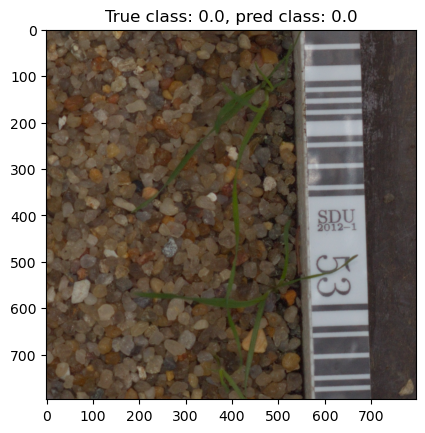

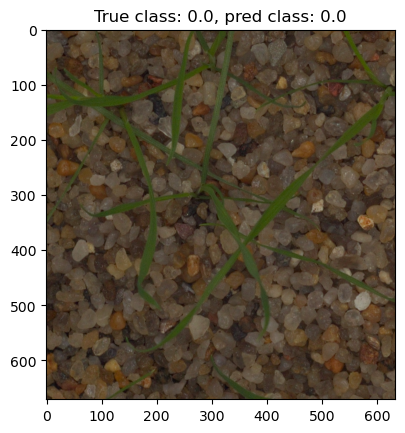

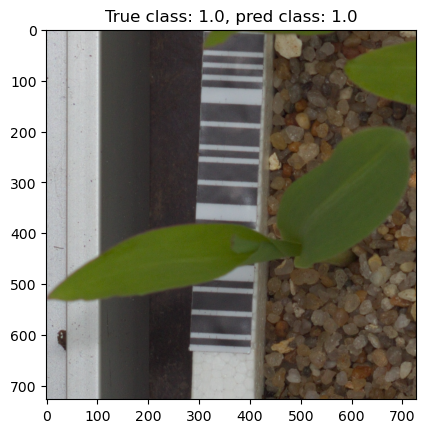

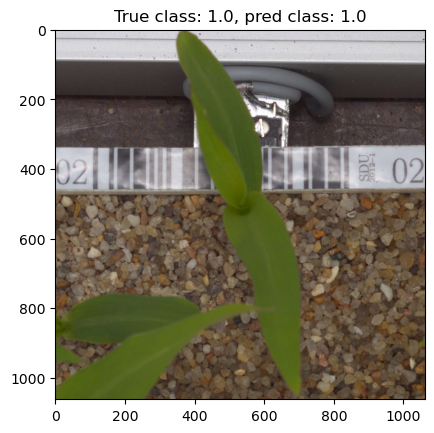

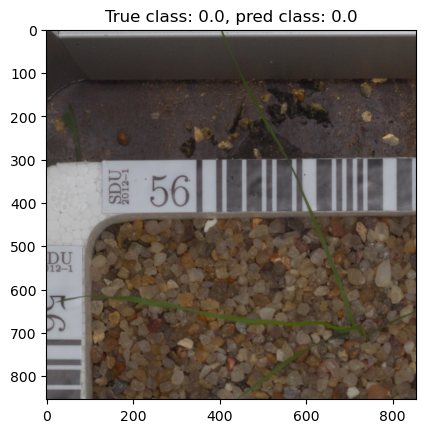

...

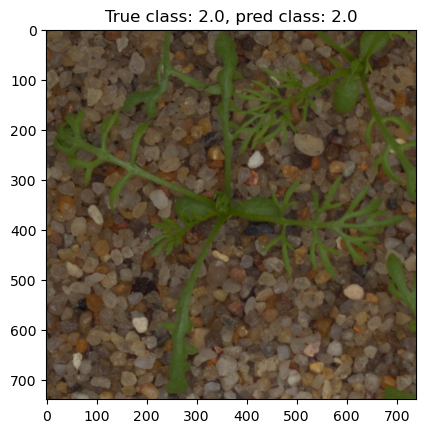

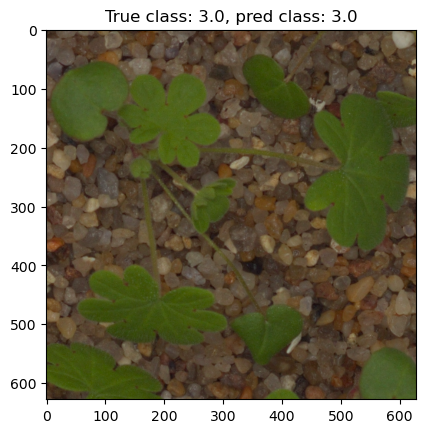

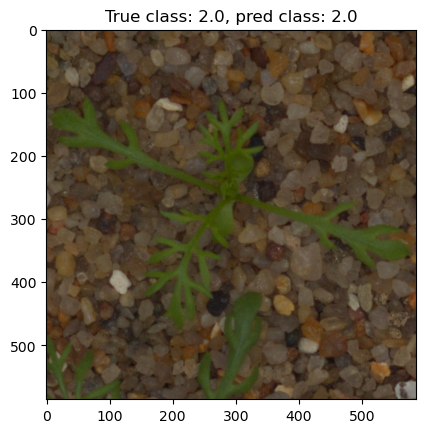

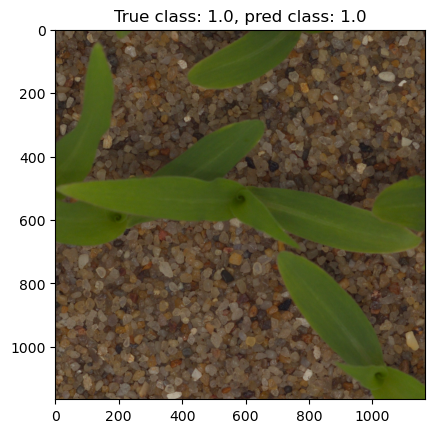

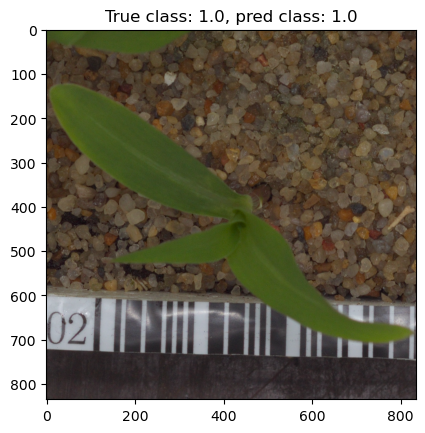

In [50]:
for idx, test in enumerate(test_images):
    plt.figure()
    plt.title(f'True class: {y_true[idx]}, pred class: {y_pred[idx]}')
    plt.imshow(test)

# Задача №2 - Собери пазл (2.0).

Даны кусочки изображения, ваша задача склеить пазл в исходную картинку. 

Условия:
* Дано исходное изображение для проверки, использовать собранное изображение в самом алгоритме нельзя;
* Картинки имеют друг с другом пересечение;
* После разрезки кусочки пазлов не были повернуты или отражены;
* НЕЛЬЗЯ выбрать опорную картинку для сбора пазла, как это было в homework 3
* В процессе проверки решения пазлы могут быть перемешаны, т.е. порядок пазлов в проверке может отличаться от исходного 

Изображения расположены по [ссылке](https://disk.yandex.ru/d/XtpawH1sV9UDlg).

Примеры изображений:
<img src="puzzle/su_fighter.jpg" alt="Drawing" style="width: 300px;"/>
<table><tr>
    <td> <img src="puzzle/su_fighter_shuffle/0.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/1.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/2.jpg" alt="Drawing" style="width: 200px;"/> </td>
    <td> <img src="puzzle/su_fighter_shuffle/3.jpg" alt="Drawing" style="width: 200px;"/> </td>
</tr></table>

In [57]:
def key_points(img1, img2, threshhold=0.5):
    sift = cv2.SIFT_create(nfeatures=400, nOctaveLayers=4, contrastThreshold=0.07, edgeThreshold=10, sigma=1.3)
    kp1, desc1 = sift.detectAndCompute(img1, None)
    kp2, desc2 = sift.detectAndCompute(img2, None)

    FLANN_INDEX_KDTREE = 2
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)

    flann = cv2.FlannBasedMatcher(index_params, search_params)
    matches = flann.knnMatch(desc1, desc2, k=2)
    
    good_matches = []
    for m, n in matches:
        if m.distance < threshhold*n.distance:
            good_matches.append(m)
    
    return kp1, kp2, good_matches

In [58]:
def getHomo(X, x, iterations=500, threshhold=5):
    maximum = 0
    for i in range(iterations):
        idx = np.random.randint(X.shape[0], size=4)
        tmp_X = X[idx]
        tmp_x = x[idx]

        ax = np.concatenate((-tmp_X, np.zeros((4, 3)), tmp_x[:, 0:1]*tmp_X), axis=1)
        ay = np.concatenate((np.zeros((4, 3)), -tmp_X, tmp_x[:, 1:]*tmp_X), axis=1)
        M = np.concatenate((ax, ay), axis=0)
        u, s, v = np.linalg.svd(M)
        H = v[8].reshape(3, 3)
        
        tmp_count = 0
        res = X.dot(H.T)
        res = np.divide(res, res[:, 2].reshape(-1, 1))
        err = np.linalg.norm(res[:, :2] - x, axis=1)
        tmp_count = np.count_nonzero(err < threshhold)

        if tmp_count > maximum:
            bestH = H
            maximum = tmp_count
    
    return bestH

In [59]:
def stitch_images(img1, img2):
    img_new = np.pad(img1, ((img1.shape[0], img1.shape[0]), (img1.shape[1], img1.shape[1]), (0, 0)), 'constant')
    kp1, kp2, gm = key_points(img_new, img2)

    src_pts = []
    dst_pts = []
    for i in range(len(gm)):
        src_pts.append([kp2[gm[i].trainIdx].pt[0], kp2[gm[i].trainIdx].pt[1]])
        dst_pts.append([kp1[gm[i].queryIdx].pt[0], kp1[gm[i].queryIdx].pt[1]])
    src_pts = np.array(src_pts)
    dst_pts = np.array(dst_pts)
    
    if (len(src_pts) == 0):
        return img1
    
    src_pts = np.concatenate((src_pts, np.ones((src_pts.shape[0], 1))), axis=1)
    
    h = getHomo(src_pts, dst_pts)
    warped = cv2.warpPerspective(img2, h, (img_new.shape[1], img_new.shape[0]))

    warped[img_new!=0] = 0
    res = cleanse(warped + img_new) 
    
    return res

In [60]:
def cleanse(img):
    for i in range(img.shape[1]-1, 0, -1):
        if (img[:, i] != 0).any():
            img = img[:, :i]
            break
            
    for i in range(0, img.shape[1]):
        if (img[:, i] != 0).any():
            img = img[:, i:]
            break
            
    for i in range(0, img.shape[0]):
        if (img[i] != 0).any():
            img = img[i:]
            break
            
    for i in range(img.shape[0]-1, 0, -1):
        if (img[i] != 0).any():
            img = img[:i]
            break
    
    return img

In [61]:
from glob import glob

images = []
for filename in glob('./puzzle/su_fighter_shuffle/*.jpg'):
    part = cv2.imread(filename)
    part = cv2.cvtColor(part, cv2.COLOR_BGR2RGB)
    images.append(part)

C:\Users\Arina\AppData\Local\Temp\ipykernel_14840\182358276.py:16: RuntimeWarning: divide by zero encountered in divide
  res = np.divide(res, res[:, 2].reshape(-1, 1))
C:\Users\Arina\AppData\Local\Temp\ipykernel_14840\182358276.py:16: RuntimeWarning: invalid value encountered in divide
  res = np.divide(res, res[:, 2].reshape(-1, 1))


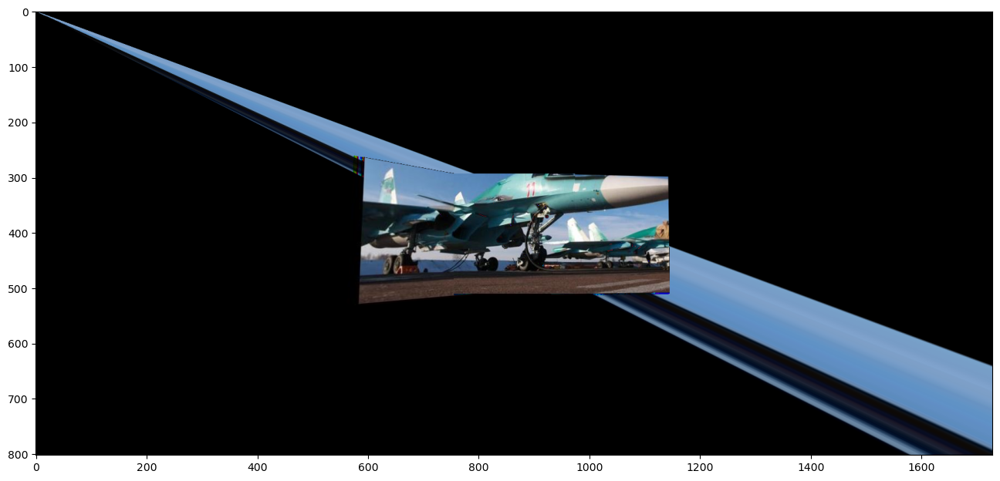

In [62]:
images[0], images[-1] = images[-1], images[0]

for i in range(len(images)-1):
    max_len = 0
    best = -1
    for j in range(1, len(images)):
        kp1, kp2, gm = key_points(images[0], images[j])
        if len(gm) > max_len:
            max_len = len(gm)
            best = j
    
    images[0] = stitch_images(images[0], images[best])
    images.pop(best)

plt.figure(figsize=(16, 8))
plt.imshow(images[0])